In [1]:
import melspecx
from pathlib import Path
from IPython.display import Audio
import librosa
import numpy as np
AUDIO_PATH = Path("./data/suzannetrimmed.wav")
audio, sr = melspecx.read_wav(str(AUDIO_PATH), normalize=False)
Audio(audio, rate=sr)
# resample to 22050
audio = librosa.resample(np.array(audio), orig_sr=sr, target_sr=22050)
sr = 22050
Audio(audio, rate=sr)


create_mel_config execution time: 0ns
Custom mel spectrogram generation time: 0.452 seconds
Frame batching time: 9.336667ms
GPU spectrogram total time: 227.7065ms
FFT compute time: 218.36575ms
mel_spectrogram_db_py execution time: 394.292083ms
Librosa mel spectrogram generation time: 0.049 seconds


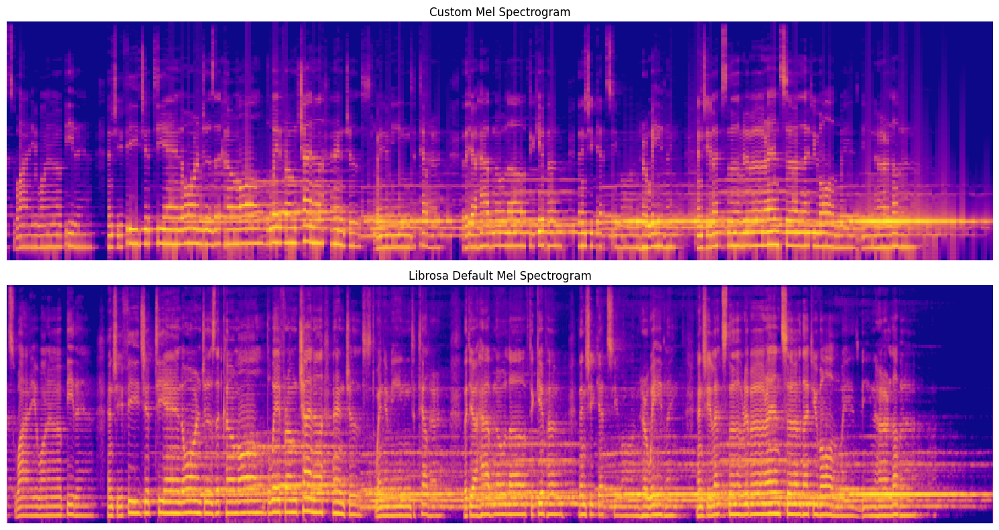

In [2]:
from IPython.display import Image
from melspecx import create_mel_config
from dataclasses import dataclass
from time import time
from librosa import display
import matplotlib.pyplot as plt
import numpy as np
import librosa

@dataclass
class MelConfig:
    sample_rate: float
    n_fft: int
    win_length: int
    hop_length: int
    f_min: float
    f_max: float
    n_mels: int
    top_db: float
    onesided: bool

# Create figure with two subplots
plt.figure(figsize=(15, 8))

# First subplot - Custom mel spectrogram
plt.subplot(2, 1, 1)
plt.title('Custom Mel Spectrogram')

# Optimized parameters for longer audio samples
config = create_mel_config(
    sample_rate=sr,
    n_fft=2048,
    win_length=512,
    hop_length=1024,
    f_min=0,
    f_max=sr / 2,
    n_mels=128,
    top_db=60,
    onesided=True,
)

# Benchmark custom implementation
custom_start = time()
config = MelConfig(**config)
mel_spec = melspecx.mel_spectrogram_db_py(config, audio)
custom_time = time() - custom_start
print(f"Custom mel spectrogram generation time: {custom_time:.3f} seconds")

mel_spec = np.array(mel_spec)
mel_spec = mel_spec.T

plt.axis('off')
spec = display.specshow(mel_spec, sr=sr, x_axis=None, y_axis=None, fmax=8000, cmap='plasma')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.margins(0, 0)

# Second subplot - Librosa default mel spectrogram
plt.subplot(2, 1, 2)
plt.title('Librosa Default Mel Spectrogram')

# Benchmark librosa implementation
librosa_start = time()
librosa_mel = librosa.feature.melspectrogram(y=np.array(audio), sr=sr)
librosa_mel_db = librosa.power_to_db(librosa_mel, ref=np.max)
librosa_time = time() - librosa_start
print(f"Librosa mel spectrogram generation time: {librosa_time:.3f} seconds")

plt.axis('off')
librosa.display.specshow(librosa_mel_db, sr=sr, x_axis=None, y_axis=None, fmax=8000, cmap='plasma')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.margins(0, 0)

plt.tight_layout()


create_mel_config execution time: 42ns
Generated mel spectrogram in 0.43 seconds
Frame batching time: 8.367708ms
GPU spectrogram total time: 165.930875ms
FFT compute time: 157.555042ms
mel_spectrogram_db_py execution time: 358.786375ms
plot_mel_spec_py plotting time: 249.552458ms
plot_mel_spec_py encoding time: 235.6665ms
plot_mel_spec_py total time: 485.231917ms


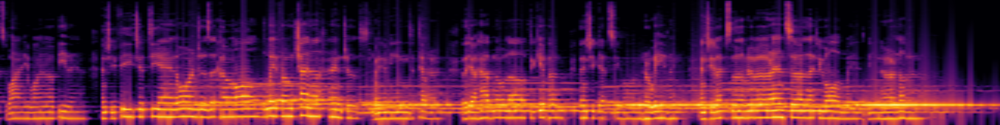

In [5]:
from IPython.display import Image
from melspecx import create_mel_config
from dataclasses import dataclass
from time import time

@dataclass
class MelConfig:
    sample_rate: float
    n_fft: int
    win_length: int
    hop_length: int
    f_min: float
    f_max: float
    n_mels: int
    top_db: float
    onesided: bool

# Optimized parameters for longer audio samples



config = create_mel_config(
    sample_rate=sr,
    n_fft=2048,
    win_length=512,
    hop_length=1024,
    f_min=0,
    f_max=sr / 2,
    n_mels=128,
    top_db=60,
    onesided=True,
)

start = time()
config = MelConfig(**config)
mel_spec = melspecx.mel_spectrogram_db_py(config, audio)
print("Generated mel spectrogram in {:0.2f} seconds".format(time() - start))
image = melspecx.plot_mel_spec_py(mel_spec=mel_spec, cmap="inferno", width_px=4096, height_px=512)
Image(image)


Audio read time: 73.824958ms
Frame batching time: 17.8415ms
GPU spectrogram total time: 312.054666ms
FFT compute time: 294.208625ms
Mel spectrogram generation time: 635.52175ms
Plotting time: 59.560875ms
Image encoding time: 162.638583ms


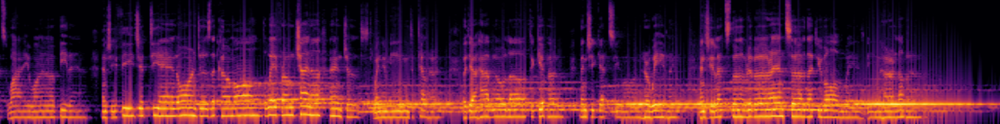

In [8]:
from IPython.display import Image
"""
 path: String,
    n_fft: usize,
    win_length: usize,
    hop_length: usize,
    f_min: f32,
    f_max: f32,
    n_mels: usize,
    colormap: String,
    width_px: u32,
    height_px: u32,
    top_db: f32,


"""



out = melspecx.mel_spec_from_path(path=str(AUDIO_PATH), n_fft=2048, win_length=512, hop_length=1024, f_min=0, f_max=sr/2, n_mels=128, colormap="inferno", width_px=2049, height_px=256, top_db=60)
Image(out)

In [ ]:
from pathlib import Path
import melspecx
from melspecx import create_mel_config
from dataclasses import dataclass
from time import time
from IPython.display import Image
AUDIO_PATH = Path("./data/suzannetrimmed.wav")
audio, sr = melspecx.read_wav(str(AUDIO_PATH), normalize=True)


@dataclass
class MelConfig:
    sample_rate: float
    n_fft: int
    win_length: int
    hop_length: int
    f_min: float
    f_max: float
    n_mels: int
    top_db: float
    onesided: bool


config = create_mel_config(
    sample_rate=sr,
    n_fft=2048,
    win_length=512,
    hop_length=1024,
    f_min=0,
    f_max=sr / 2,
    n_mels=128,
    top_db=60,
    onesided=True,
)
# convert to named tuple

start = time()
config = MelConfig(**config)
mel_spec = melspecx.mel_spectrogram_db_py(config, audio)
print("Generated mel spectrogram in {:0.2f} seconds".format(time() - start))
image = melspecx.plot_mel_spec_py(mel_spec, "inferno", 1024, 256)
Image(image)